# 1. Load dataset
#### In this notebook, K-means clustering model has been built to find clusters in the given news articles dataset.
#### First, we will need to read the data from data file (news.xlsx). It contains three columns: news category, news title, and the news content.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
df = pd.read_excel('news.xlsx')

In [3]:
from string import digits

# some kind of map table to remove all the digits from the string 
table = ''.maketrans('', '', digits)

def clean_text(text: str, table=table) -> str:
    symbol_mapping = (
        ("ə", "e"),
        ("ı", "i"),
        ("ö", "o"),
        ("ğ", "g"),
        ("ü", "u"),
        ("ş", "s"),
        ("ç", "c"),
        ("-", ''),
    )

    lower_text = text.strip().lower()

    for before, after in symbol_mapping:
        lower_text = lower_text.replace(before, after)

    return lower_text.translate(table)

In [4]:
# filtering text fields
df['Title'] = df['Title'].apply(lambda x: clean_text(x))
df['News_Article'] = df['News_Article'].apply(lambda x: clean_text(x))

In [4]:
# List of all categories
list(df['Category'].unique())

['Maraqlı', 'İdman', 'Dünya', 'Siyasət', 'İqtisadiyyat', 'Mədəniyyət']

In [5]:
# Splitting the dataset into train and test
X = df['News_Article']
Y = df['Category']
seed = 7
test_size = 10000
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

# 2. Data preprocessing
#### We are expected to extract features from the news articles using tf-idf representation techniques. TfidfVectorizer is ideal for this purpose. YoWeu may want to limit the vocabulary size by choosing most frequent 3000 (or any limiting number that is not too big) tokens.

In [6]:
# Building custom stop words to identify and ignore "useless" words that might distort the algorithm
stop_words = [
    've', 'bir', 'ile', 'ci', 'bu', 'ilde', 'of', 'ise', 'sonra', 'ki', 'ucun', 'da', 'de', 'olan', 'az',
    'kimi', 'edir', 'cox', 'terefinden', 'the', 'e', 'gore', 'xan', 'onun', 'idi', 'en', 'il', 'olaraq',
    'cü', 'and', 's', 'haqqinda', 'o', 'ilk', 'zaman', 'oz', 'cu', 'daha', 'ci', 'eden', 'olur', 'butun',
    'istifade', 'onu', 'etmek', 'qeder', 'arasinda', 'biri', 'ona', 'her', 'etmişdir', 'a', 'var', 'in',
    'ya', 'nin', 'aza', 'özü', 'sey', 'si', 'adsadnow', 'sc_start_', 'sc_c', 'gettime', 'date',
]

In [7]:
def tf_idf(corpus, max_limit=None, stop_words=stop_words, default_vect=None):    
    if default_vect is not None:
        X = default_vect.transform(corpus)
        
        return X.toarray()
    
    vectorizer = TfidfVectorizer(stop_words=stop_words, max_features=max_limit)
    X = vectorizer.fit_transform(corpus)
    
    return X.toarray(), vectorizer

In [8]:
# Fit for train and transform for the test data
X_trn, vect = tf_idf(X_train, 3000)

In [9]:
X_tst = tf_idf(X_test, 3000, default_vect=vect)

# 3. PCA
#### Applying PCA on the prepared data with 3 components.

In [10]:
pca = PCA(n_components=3)

k_means = KMeans(
    init="random",
    n_clusters=6,
    n_init=10,
    max_iter=300,
    random_state=42
)

pipe = Pipeline(
    [
        ('pca', pca),
        ('k_means', k_means)
    ]
)
Xt = pipe.fit_transform(X_trn)

In [11]:
# pca.explained_variance_ratio_

array([0.0114561 , 0.00979942, 0.00784803])

In [12]:
pca_trans = pca.transform(X_trn)

In [13]:
pca_trans.shape

(40000, 3)

# 4. Visualization
#### Visualize the data in 3D.

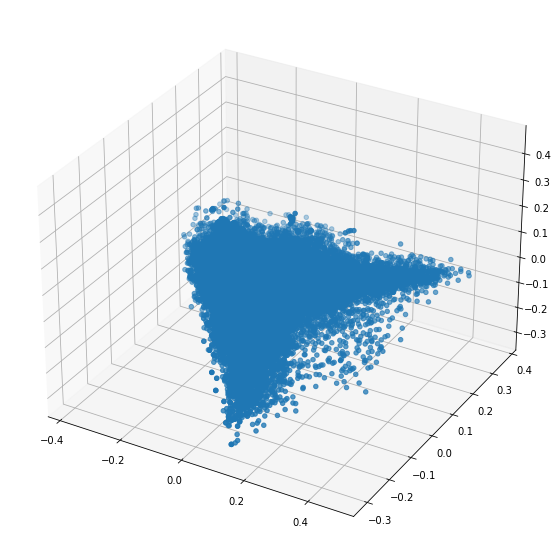

In [14]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

ax.scatter(pca_trans[:, 0], pca_trans[:, 1], pca_trans[:, 2])


plt.show()

# 5. Clustering
#### Apply Kmeans clustering on the data.

In [15]:
k_means.inertia_

319.9569586573766

In [16]:
k_means.cluster_centers_

array([[ 0.01271494, -0.16948324,  0.27887616],
       [-0.05033172, -0.03379425, -0.00508681],
       [ 0.21391214,  0.12404864,  0.01003488],
       [-0.12372495,  0.10064646, -0.00710067],
       [ 0.0536829 ,  0.02464681,  0.0222483 ],
       [ 0.04787816, -0.12525623, -0.11339602]])

# 6. Visualization
#### Visualizing the data in 3D with cluster as color. Using plotly to make it interactive.

In [19]:
import plotly.express as px


fig = px.scatter_3d( 
    x=pca_trans[:, 0], y=pca_trans[:, 1], z=pca_trans[:, 2],
    color=list(k_means.labels_),
    width=600
)

fig.show()

# Elbow plot

In [20]:
dist = []

for k in range(1, 10):
    k_m = KMeans(n_clusters=k)
    k_m.fit(Xt)
    
    dist.append(k_m.inertia_)

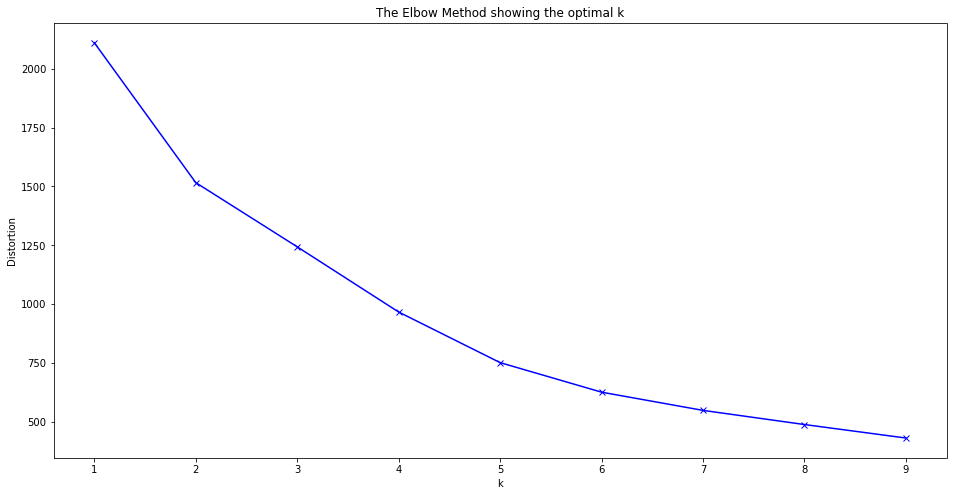

In [21]:
plt.figure(figsize=(16,8))
plt.plot(range(1, 10), dist, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [22]:
# Silhoutte Score
score = silhouette_score(Xt, k_means.labels_, metric='euclidean')
# score

0.30032643475189597